# STYLE-ALIGNED WITH CONTROLNET

In [31]:
# Clone the repository
!git clone https://github.com/alessioborgi/StyleAligned_MultiReference-MultiModal.git

# Change directory to the cloned repository
%cd StyleAlignedDiffModels
%ls

# Set up Git configuration
# !git config --global user.name "Alessio Borgi"
# !git config --global user.email "alessioborgi3@gmail.com"

!git config --global user.name "Name Surname"
!git config --global user.email "email@gmail.com"

# Stage the changes
#!git add .

# Commit the changes
#!git commit -m "Added some content to your-file.txt"

# Push the changes (replace 'your-token' with your actual personal access token)
#!git push origin main

Cloning into 'StyleAlignedDiffModels'...
remote: Enumerating objects: 446, done.
remote: Counting objects: 100% (170/170), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 446 (delta 87), reused 134 (delta 67), pack-reused 276
Receiving objects: 100% (446/446), 130.79 MiB | 13.42 MiB/s, done.
Resolving deltas: 100% (244/244), done.
/content/StyleAlignedDiffModels/StyleAlignedDiffModels
imgs/      requirements.txt               StyleAligned_Explanation.ipynb
LICENSE    src/                           StyleAligned_with_Prompts_only.ipynb
README.md  StyleAligned_ControlNet.ipynb  StyleAligned_with_Reference.ipynb


In [2]:
# Install the required packages
!pip install -r requirements.txt > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.3.1+cu121 requires torch==2.3.1, but you have torch 2.2.2 which is incompatible.
torchtext 0.18.0 requires torch>=2.3.0, but you have torch 2.2.2 which is incompatible.


In [3]:
from diffusers import ControlNetModel, StableDiffusionXLControlNetPipeline, AutoencoderKL
from diffusers.utils import load_image
from transformers import DPTImageProcessor, DPTForDepthEstimation
import torch
import mediapy
from src.Handler import Handler
from src.StyleAlignedArgs import StyleAlignedArgs
from src.ControlNet import SDXL_ControlNet_Model
from src.Depth_Map import get_depth_map
from src.HarrisCorner import get_edge_map

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/usr/local/lib/python3.10/dist-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/usr/local/lib/python3.10/dist-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
/usr/local/lib/python3.10/dist-packages/diffusers/utils/outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [4]:
# Load the ControlNet model with specified parameters.
ControlNet_Model = ControlNetModel.from_pretrained(
    "diffusers/controlnet-depth-sdxl-1.0",  # Model identifier.
    variant="fp16",                         # Use 16-bit floating point precision.
    use_safetensors=True,                   # Use SafeTensors for security.
    torch_dtype=torch.float16               # Set Torch data type to float16.
).to("cuda")                                # Move model to GPU.

# Load the AutoencoderKL model with specified parameters.
AutoencoderKL_Model = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix",        # Model identifier.
    torch_dtype=torch.float16               # Set Torch data type to float16.
).to("cuda")                                # Move model to GPU.

# Initialize the Stable Diffusion XL ControlNet Pipeline
SDXL_ControlNet_Pipeline = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",  # Model identifier.
    controlnet=ControlNet_Model,                       # Attach the loaded ControlNet model.
    vae=AutoencoderKL_Model,                                     # Attach the loaded AutoencoderKL model.
    variant="fp16",                              # Use 16-bit floating point precision.
    use_safetensors=True,                        # Use SafeTensors for security.
    torch_dtype=torch.float16                    # Set Torch data type to float16.
).to("cuda")                                     # Move pipeline to GPU.

# Enable model CPU offload to optimize memory usage.
SDXL_ControlNet_Pipeline.enable_model_cpu_offload()

# Define Style Aligned Arguments with specified parameters.
sa_args = StyleAlignedArgs(
    share_group_norm=False,     # Do not share GroupNorm layers.
    share_layer_norm=False,     # Do not share LayerNorm layers.
    share_attention=True,       # Share Attention layers.
    adain_queries=True,         # Apply Adaptive Instance Normalization to queries.
    adain_keys=True,            # Apply Adaptive Instance Normalization to keys.
    adain_values=False          # Do not apply Adaptive Instance Normalization to values.
)

# Initialize Handler with the pipeline.
handler = Handler(SDXL_ControlNet_Pipeline)

# Register the Style Aligned Arguments with the handler.
handler.register(sa_args)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.27k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

#### 7.1: CONTROL-NET WITH SIMPLE IMAGE & STYLE-ALIGNMENT

""

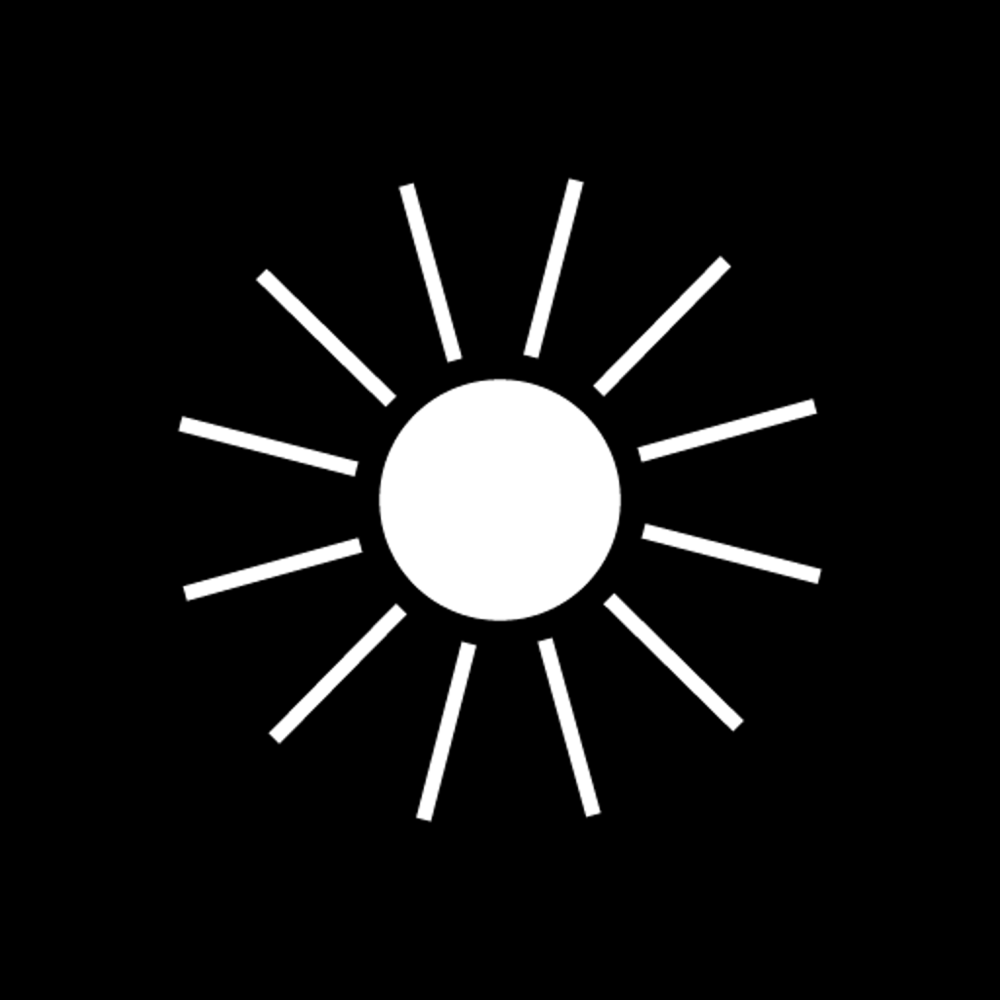

In [5]:
# Load and resize the control image to 1024x1024 pixels.
control_image = load_image("./imgs/sun.png").resize((1024, 1024))

# Display the control image using mediapy.
mediapy.show_image(control_image)

  0%|          | 0/50 [00:00<?, ?it/s]

reference,depth,result 1,result 2,result 3

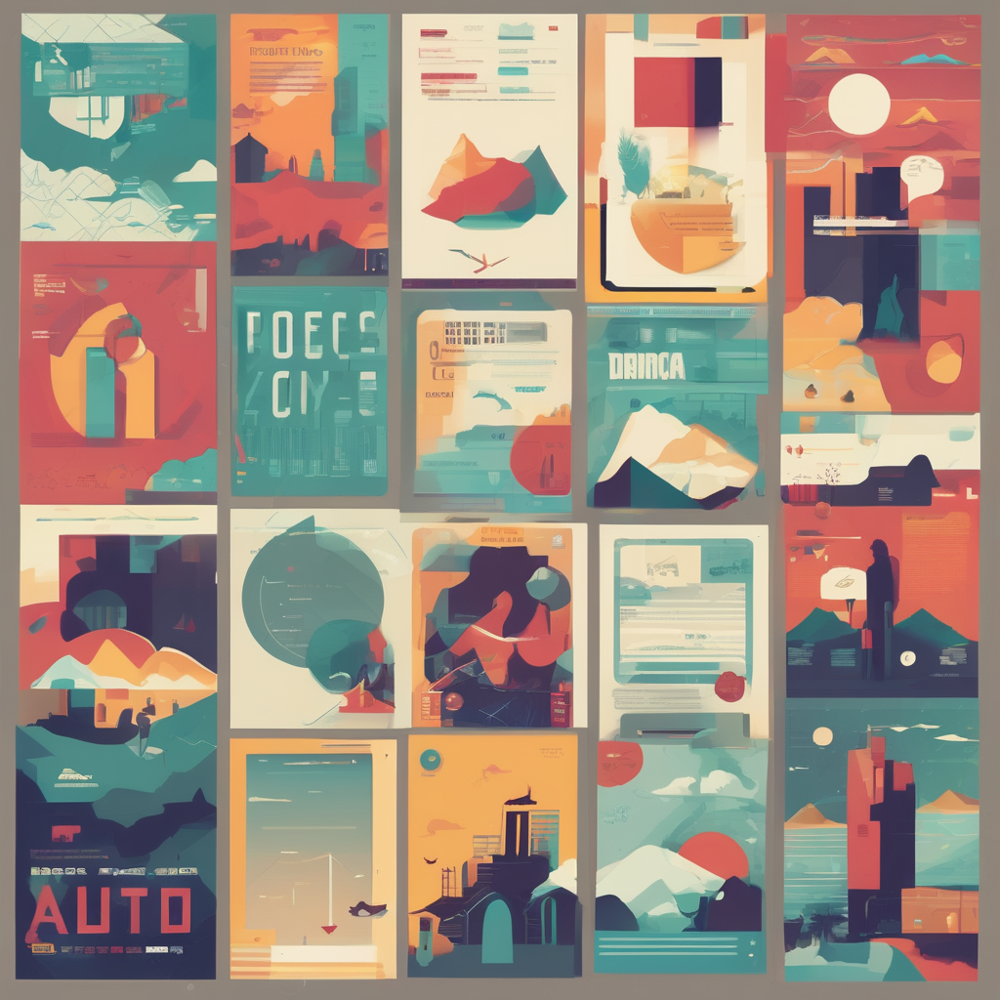
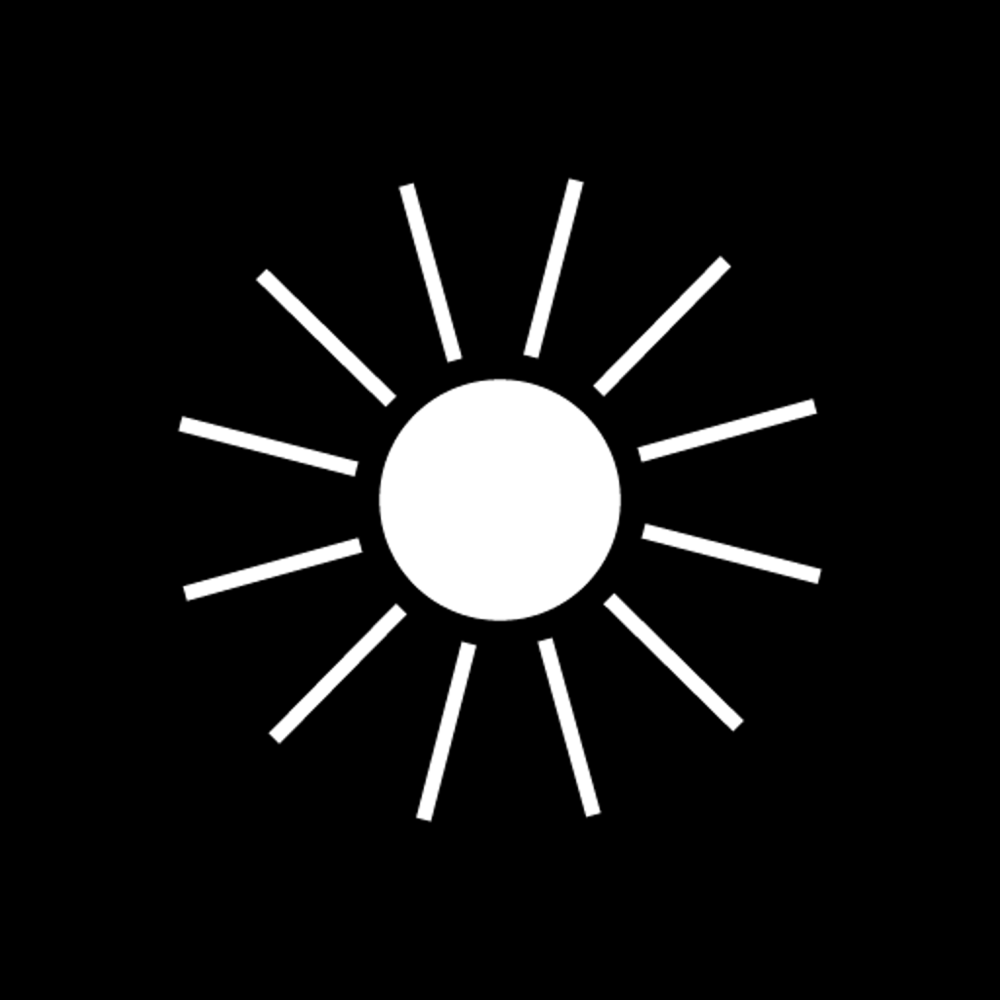
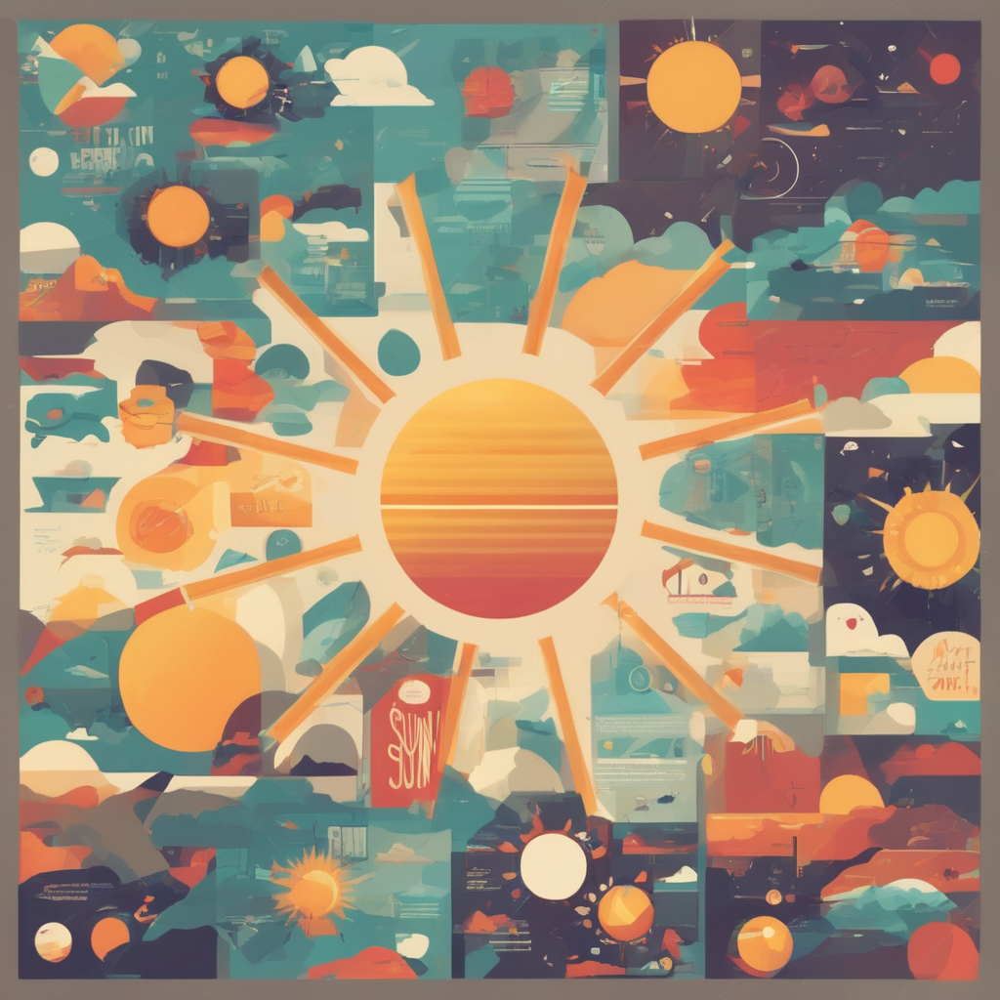
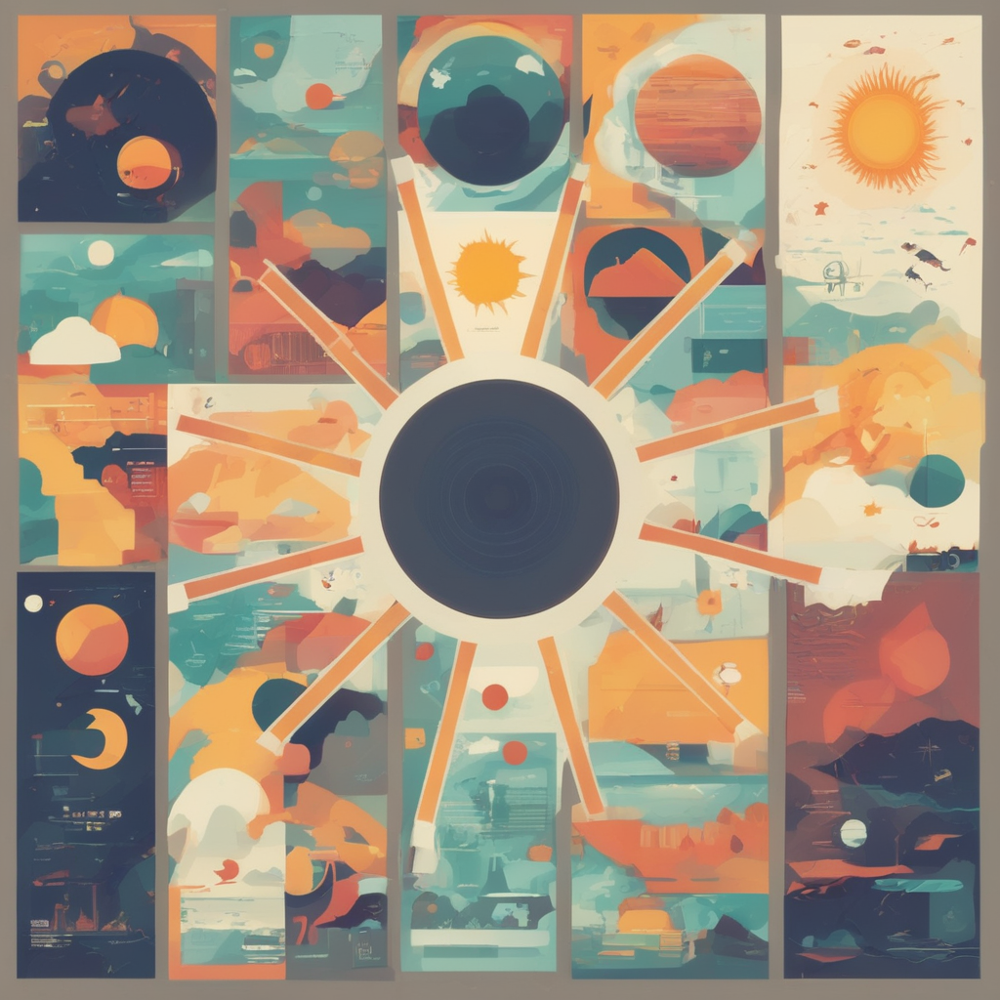
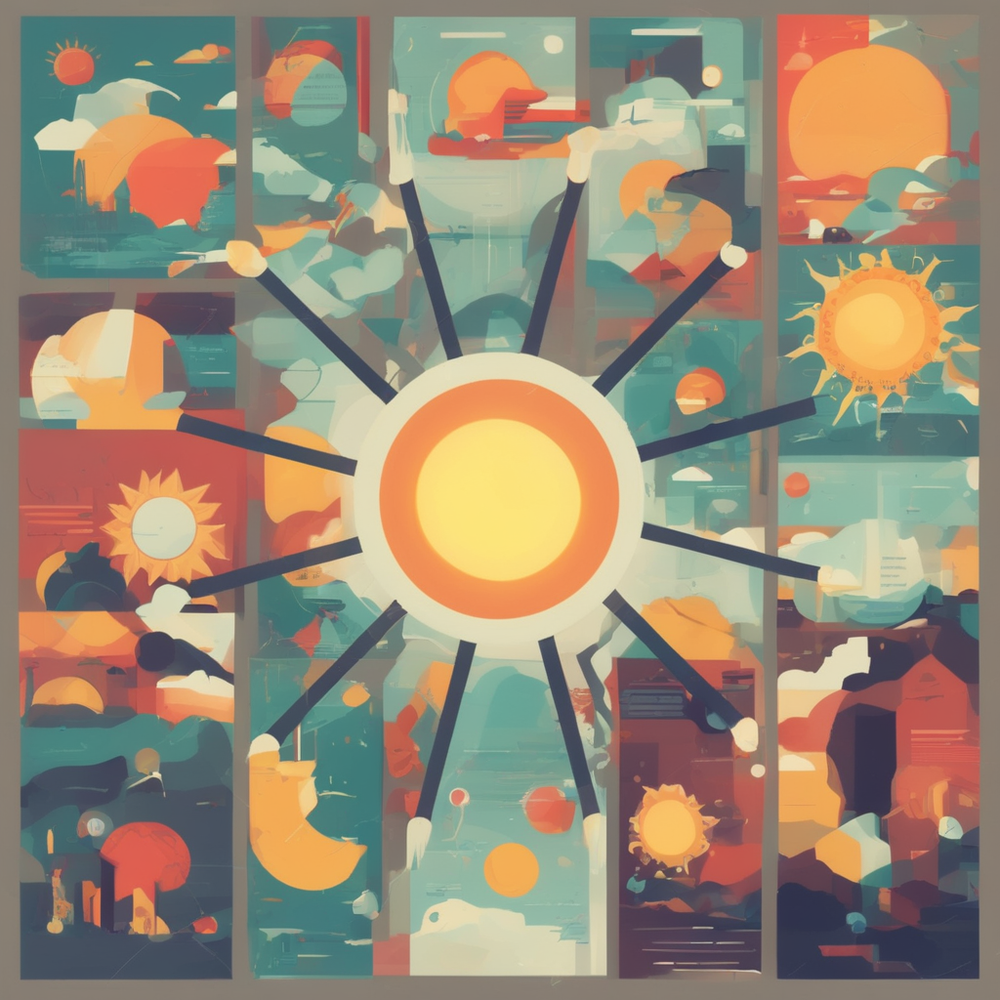

In [6]:
# Define the reference style and prompts for the controlnet.
reference_style_controlnet = "flat design style"
reference_prompt = f"a poster in {reference_style_controlnet}"
target_prompt = f"the sun in {reference_style_controlnet}"

# Set the conditioning scale for controlnet.
controlnet_conditioning_scale = 0.8

# Specify the number of images to generate per prompt.
num_images_per_prompt = 3  # Adjust according to VRAM at your disposal.

# Generate random latents for the inference process.
latents = torch.randn(1 + num_images_per_prompt, 4, 128, 128).to(SDXL_ControlNet_Pipeline.unet.dtype)
latents[1:] = torch.randn(num_images_per_prompt, 4, 128, 128).to(SDXL_ControlNet_Pipeline.unet.dtype)

# Call the controlnet pipeline to generate images based on the prompts and control image.
images_generated = SDXL_ControlNet_Model(SDXL_ControlNet_Pipeline, [reference_prompt, target_prompt],
                         image=control_image,
                         num_inference_steps=50,
                         controlnet_conditioning_scale=controlnet_conditioning_scale,
                         num_images_per_prompt=num_images_per_prompt,
                         latents=latents)

# Display the generated images along with the control image.
mediapy.show_images(
    [images_generated[0], control_image] + images_generated[1:],
    titles=["reference", "depth"] + [f'result {i}' for i in range(1, len(images_generated))]
)

#### 7.2: CONTROL-NET WITH DEPTH MAP & STYLE-ALIGNMENT


""

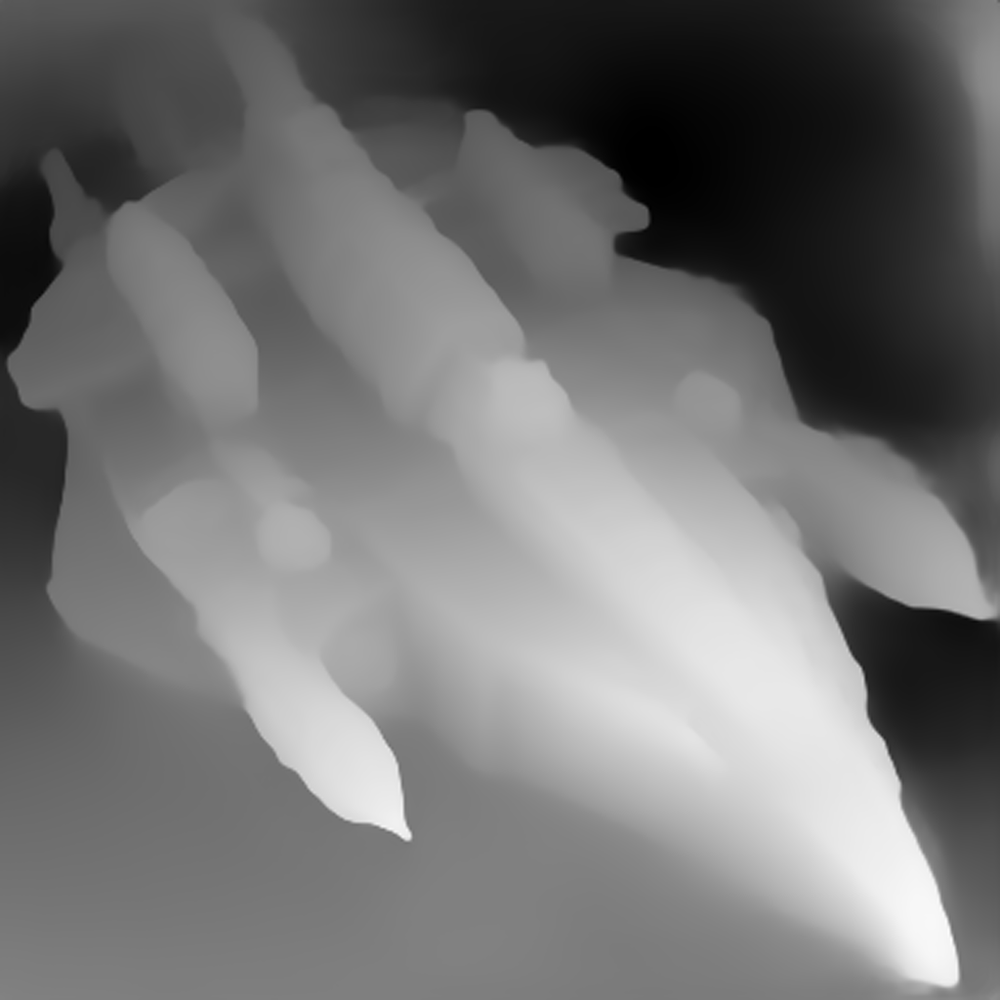

In [37]:
# Load the DPT model for depth estimation and move it to the GPU.
DPT_Estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")

# Load the corresponding image processor for the DPT model.
DPT_Feature_Processor = DPTImageProcessor.from_pretrained("Intel/dpt-hybrid-midas")

# Load the control image from the specified path.
control_image = load_image("./imgs/spaceship.jpeg")

# Generate a depth map for the control image using the feature processor and depth estimator.
control_depth_image = get_depth_map(control_image, DPT_Feature_Processor, DPT_Estimator)

# Display the generated depth map using mediapy.
mediapy.show_image(control_depth_image)

  0%|          | 0/50 [00:00<?, ?it/s]

reference,depth,result 1,result 2,result 3

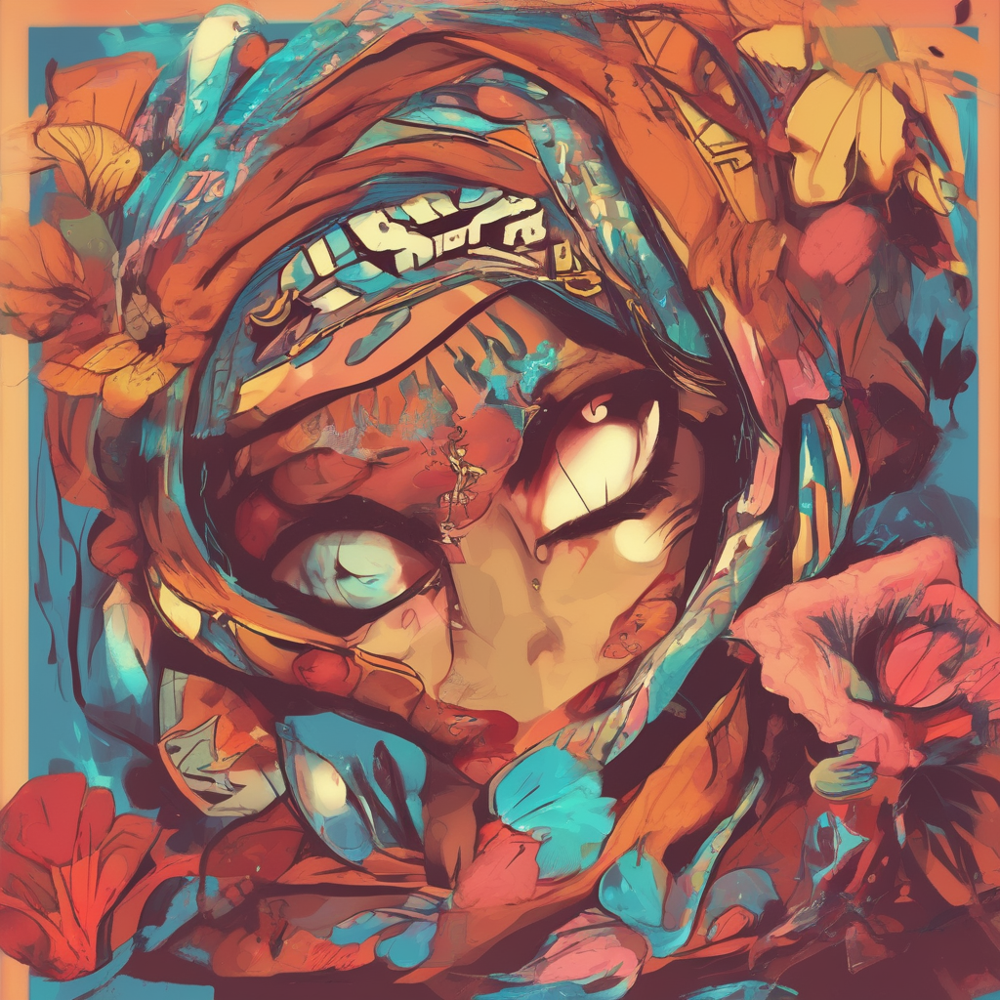
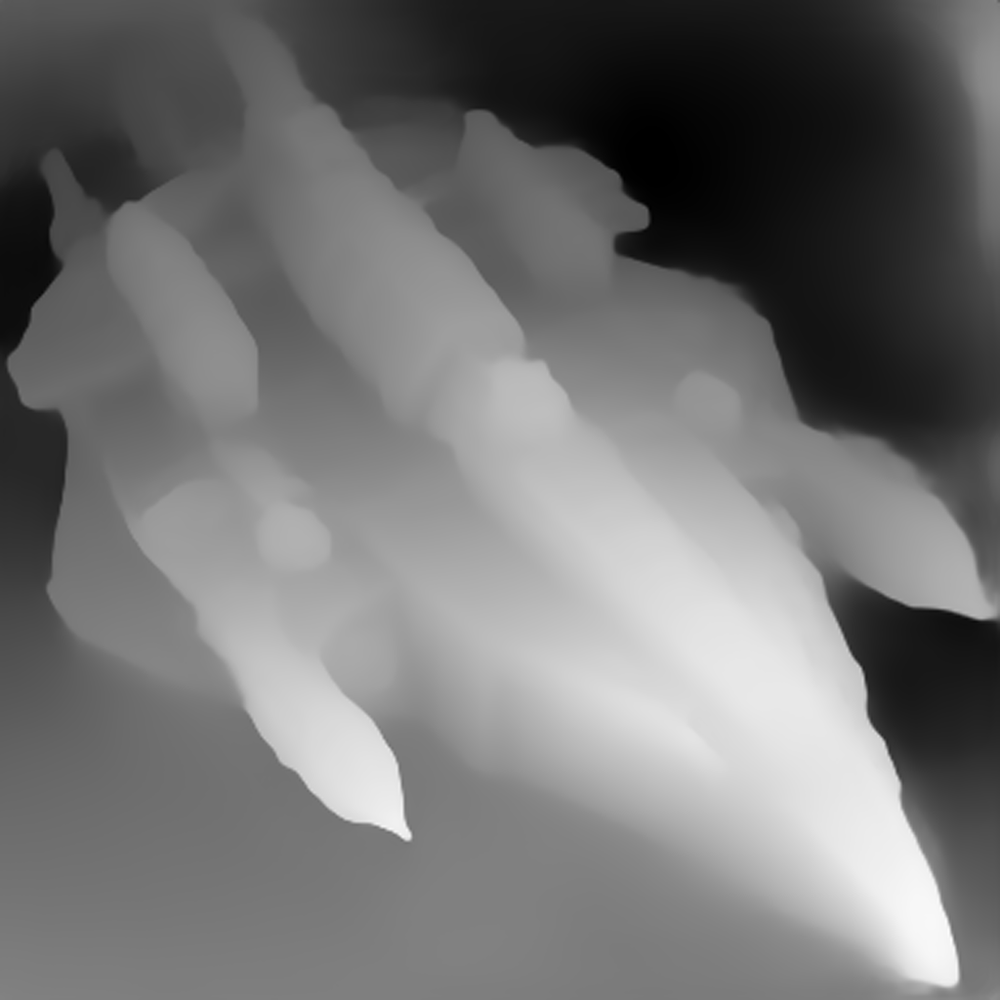
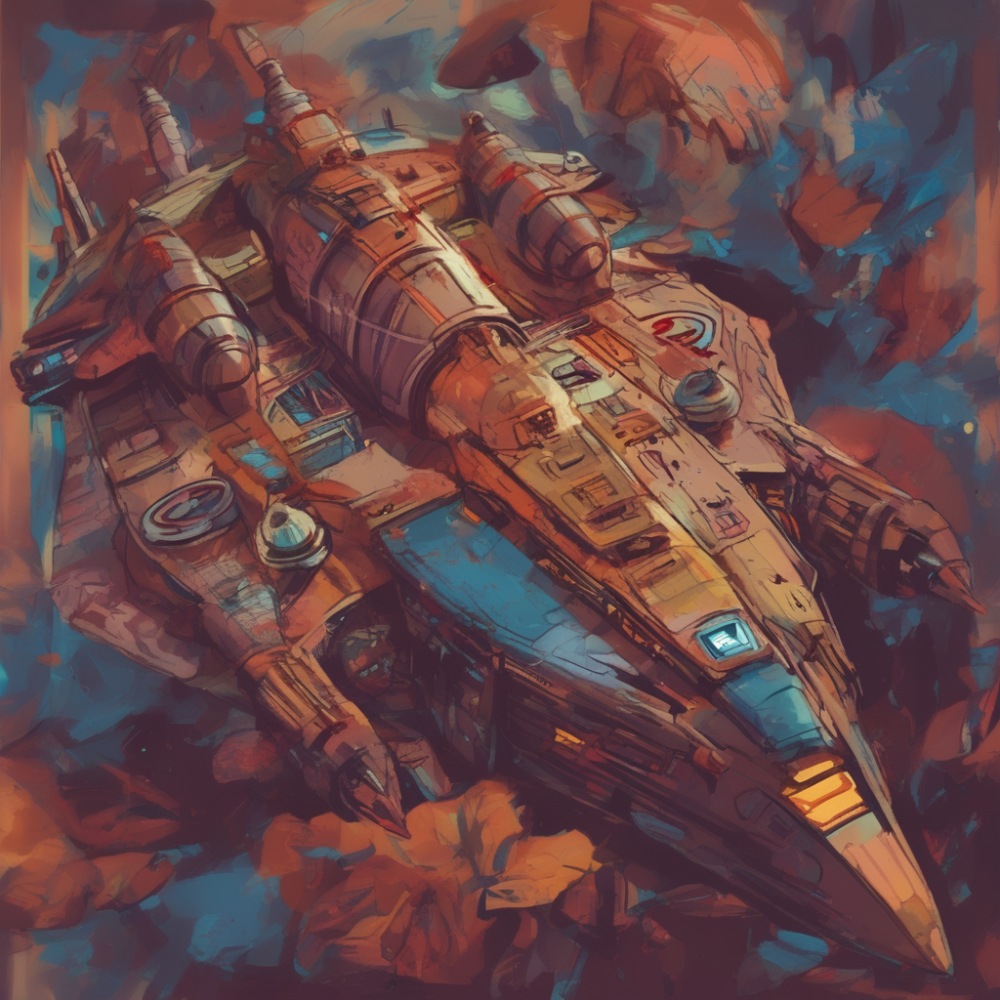
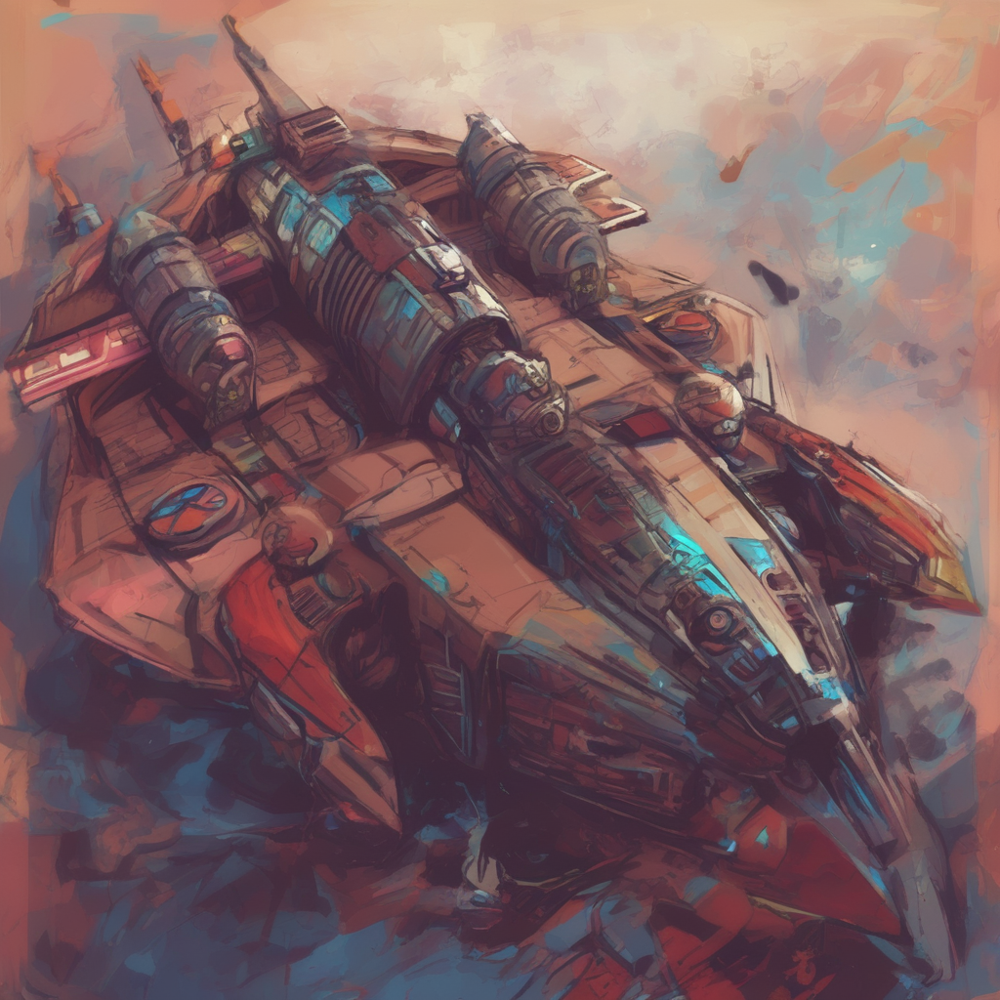
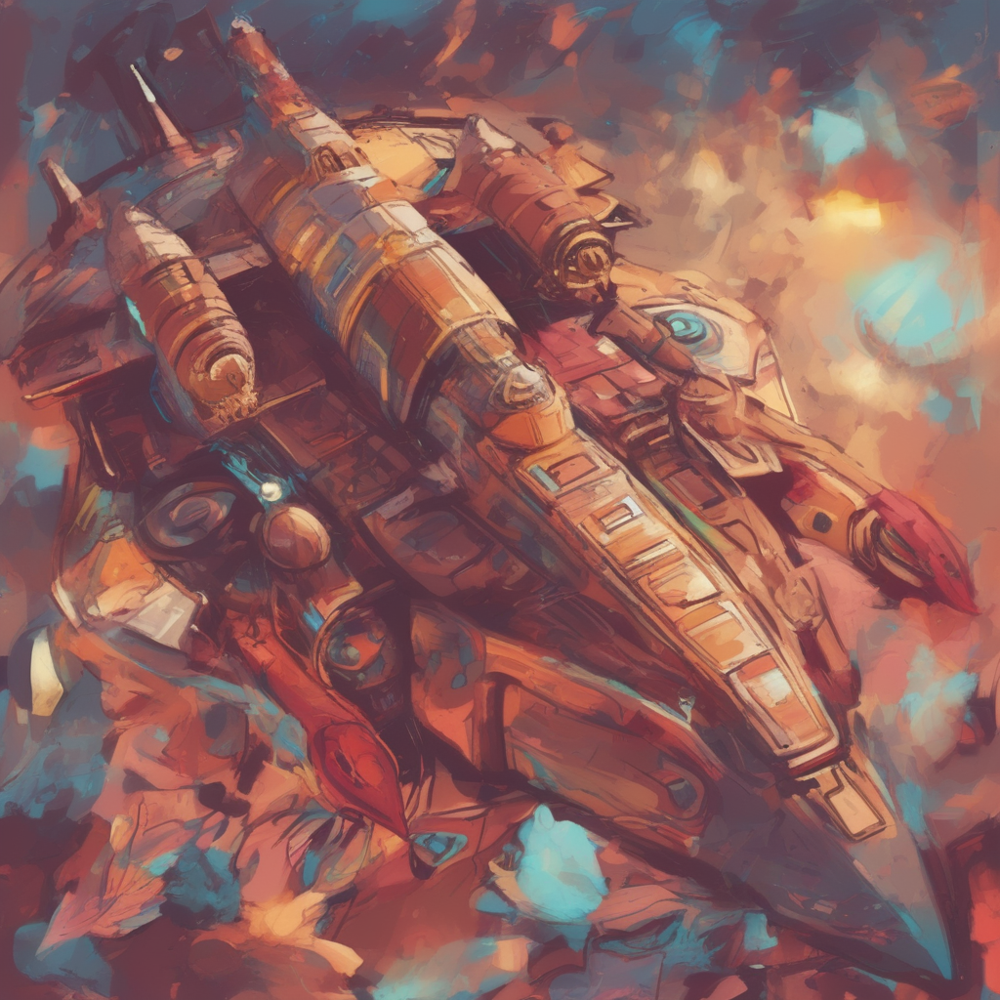

In [38]:
# Define the reference style for ControlNet.
reference_style_controlnet = "digital painting style"

# Create prompts for reference and target images.
reference_prompt = f"a poster in {reference_style_controlnet}"  # Prompt for generating the reference image.
target_prompt = f"a spaceship in {reference_style_controlnet}"      # Prompt for generating the target image.

# Set the conditioning scale for ControlNet.
controlnet_conditioning_scale = 0.8

# Specify the number of images to generate per prompt.
num_images_per_prompt = 3  # Adjust according to VRAM size.

# Generate random latents for the inference process.
latents = torch.randn(1 + num_images_per_prompt, 4, 128, 128).to(SDXL_ControlNet_Pipeline.unet.dtype)
latents[1:] = torch.randn(num_images_per_prompt, 4, 128, 128).to(SDXL_ControlNet_Pipeline.unet.dtype)

# Call the ControlNet pipeline to generate images based on the prompts and control depth image.
images = SDXL_ControlNet_Model(
    SDXL_ControlNet_Pipeline,
    [reference_prompt, target_prompt],  # Reference and target prompts.
    image=control_depth_image,          # Control depth image input.
    num_inference_steps=50,             # Number of inference steps.
    controlnet_conditioning_scale=controlnet_conditioning_scale,  # Conditioning scale for ControlNet.
    num_images_per_prompt=num_images_per_prompt,  # Number of images to generate per prompt.
    latents=latents                     # Latents for the inference process.
)

# Display the generated images along with the control depth image.
mediapy.show_images(
    [images[0], control_depth_image] + images[1:],  # Reference image, control depth image, and other generated images.
    titles=["reference", "depth"] + [f'result {i}' for i in range(1, len(images))]  # Titles for each image.
)

#### 7.3: CONTROL-NET WITH EDGE MAP (CANNY DETECTOR) & STYLE-ALIGNMENT

In [ ]:
# Load the DPT model for depth estimation and move it to the GPU.
DPT_Estimator = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to("cuda")

# Load the corresponding image processor for the DPT model.
DPT_Feature_Processor = DPTImageProcessor.from_pretrained("Intel/dpt-hybrid-midas")

# Load the control image from the specified path.
control_image = load_image("./imgs/supermario.jpg")

# Generate edge map for the control image using the feature processor and depth estimator.
control_edge_image = get_edge_map(control_image, DPT_Feature_Processor, DPT_Estimator)

# Display the generated depth map using mediapy.
mediapy.show_image(control_edge_image)

In [ ]:
# Define the reference style for ControlNet.
reference_style_controlnet = "a papercut art style"

# Create prompts for reference and target images.
reference_prompt = f"a poster in {reference_style_controlnet}"  # Prompt for generating the reference image.
target_prompt = f"SuperMario in {reference_style_controlnet}"      # Prompt for generating the target image.

# Set the conditioning scale for ControlNet.
controlnet_conditioning_scale = 0.8

# Specify the number of images to generate per prompt.
num_images_per_prompt = 3  # Adjust according to VRAM size.

# Generate random latents for the inference process.
latents = torch.randn(1 + num_images_per_prompt, 4, 128, 128).to(SDXL_ControlNet_Pipeline.unet.dtype)
latents[1:] = torch.randn(num_images_per_prompt, 4, 128, 128).to(SDXL_ControlNet_Pipeline.unet.dtype)

# Call the ControlNet pipeline to generate images based on the prompts and control edge image.
images = SDXL_ControlNet_Model(
    SDXL_ControlNet_Pipeline,
    [reference_prompt, target_prompt],  # Reference and target prompts.
    image=control_edge_image,            # Control edge image input.
    num_inference_steps=50,              # Number of inference steps.
    controlnet_conditioning_scale=controlnet_conditioning_scale,  # Conditioning scale for ControlNet.
    num_images_per_prompt=num_images_per_prompt,  # Number of images to generate per prompt.
    latents=latents                     # Latents for the inference process.
)

# Display the generated images along with the control edge image.
mediapy.show_images(
    [images[0], control_edge_image] + images[1:],  # Reference image, control edge image, and other generated images.
    titles=["reference", "edge"] + [f'result {i}' for i in range(1, len(images))]  # Titles for each image.
)

In [36]:
import tensorflow as tf
import torch

def clear_gpu_memory():
    # Clear TensorFlow GPU memory
    tf.keras.backend.clear_session()
    tf.compat.v1.reset_default_graph()

    # Clear PyTorch GPU memory
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

    print("GPU memory cleared.")

# Execute the function to clear GPU memory
clear_gpu_memory()


GPU memory cleared.
